<a href="https://colab.research.google.com/github/nickzherdev/Chaos/blob/master/skcr_overcoming_obstacles_sim.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Imports

In [0]:
from IPython.display import Image, HTML
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import requests
import io
from PIL import Image  
import PIL
from scipy.ndimage.filters import gaussian_filter

import matplotlib.animation
plt.rcParams["animation.html"] = "jshtml"
from random import random
from matplotlib.animation import FuncAnimation
%config InlineBackend.figure_format ='retina'
#%matplotlib notebook

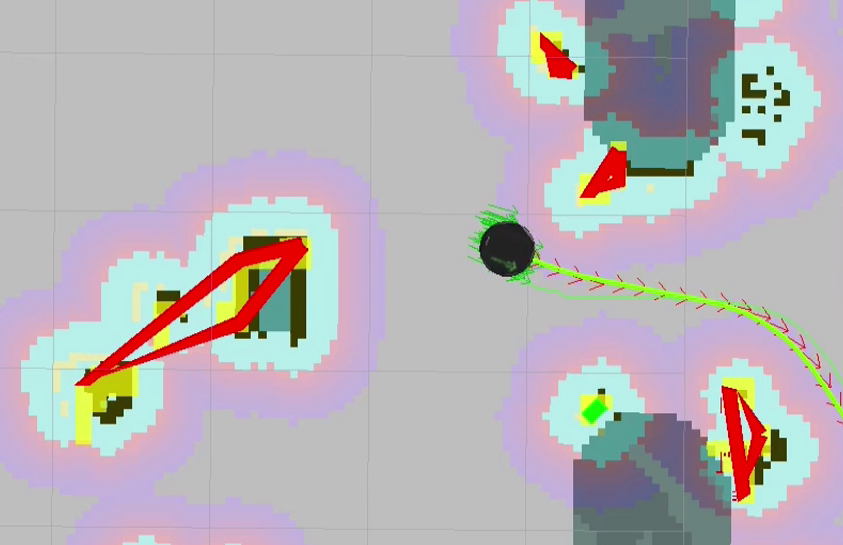

In [29]:
import requests
from IPython.display import Image
url1 = "http://wiki.ros.org/costmap_converter?action=AttachFile&do=get&target=costmap_converter_convex_hull.png"
url2 = "http://wiki.ros.org/costmap_converter?action=AttachFile&do=get&target=CostmapToPolygonsDBSMCCH_2.png"

Image(requests.get(url1).content)  # , width=300, height=300

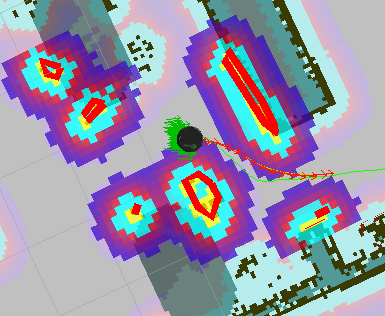

In [30]:
Image(requests.get(url2).content)

In [0]:
# from enum import Enum
# class Costs(Enum):

box = 5
bottle = 3
empty = 0
wall = 255
unknown = 254

## Mandelbrot edition

In [0]:
# from matplotlib import animation, rc
# import numpy as np
# import matplotlib.pyplot as plt
# %matplotlib inline 
# %config InlineBackend.figure_format='retina'
# rc('animation', html='html5')
# # отображать анимацию в виде html5 video

# def mandelbrot(pmin, pmax, ppoints, qmin, qmax, qpoints, 
#                max_iterations=200, infinity_border=10):
#     image = np.zeros((ppoints, qpoints))
#     p, q = np.mgrid[pmin:pmax:(ppoints*1j), qmin:qmax:(qpoints*1j)]
#     c = p + 1j*q
#     z = np.zeros_like(c)
#     for k in range(max_iterations):
#         z = z**2 + c
#         mask = (np.abs(z) > infinity_border) & (image == 0)
#         image[mask] = k
#         z[mask] = np.nan
#     return -image.T

# def check_mandelbrot():
#     plt.figure(figsize=(10, 10))
#     image = mandelbrot(-2.5, 1.5, 1000, -2, 2, 1000)
#     plt.xticks([])
#     plt.yticks([])
#     plt.imshow(image, cmap='flag', interpolation='none')


# fig = plt.figure(figsize=(10, 10))
# max_frames = 200
# max_zoom = 300
# pmin, pmax, qmin, qmax = -2.5, 1.5, -2, 2

# images = []
# # кэш картинок

# def init():
#     return plt.gca()

# def animate(i):

#     image = mandelbrot(pmin_, pmax_, 500, qmin_, qmax_, 500)
#     plt.imshow(image, cmap=cmap)
#     images.append(image)
    
#     # добавить картинку в кэш
#     return plt.gca()

# animation.FuncAnimation(fig, animate, init_func=init,
#                                frames=max_frames, interval=50)

## A* and Grid Map

*   Algorithm for building a costmap

    *   Multi-layers (+)
    *   Free / occupied cells for one layer (+)
    *   Cost of occupation on another layer (+)
    *   layer with inflated obtsacles with robot radius (and the robot stays as a point) (+)
    *   database: object ID - object class - set of corresponding cells
    *   unrecognized objects are not stored in database of things that can be manipulated
    *   if the path leads through any object area, the corresponding class and action can be derived from obj database

    *   Boxes, bottles, narrow coridor (+)
    *   Better choose smaller objects to move


*   Algorithm for parsing an image and extracting configuration of obstacles (+)
*   Algorithm for building a path on a costmap (considering different costs of each cell) (+)

In [33]:
%%shell
# git clone https://github.com/nickzherdev/occupancy-grid-a-star.git

Cloning into 'occupancy-grid-a-star'...
remote: Enumerating objects: 17, done.
remote: Total 17 (delta 0), reused 0 (delta 0), pack-reused 17
Unpacking objects: 100% (17/17), done.


In [37]:
%cd /content/occupancy-grid-a-star

from gridmap import OccupancyGridMap
import matplotlib.pyplot as plt
from a_star import a_star
from utils import plot_path

/content/occupancy-grid-a-star


In [38]:
!pwd

/content/occupancy-grid-a-star


### Try original version of A* and Gridmap

In [0]:
gmap = OccupancyGridMap.from_png('examples/maps/example_map_occupancy.png', 1)
# gmap.plot()

In [41]:
gmap.dim_meters

(420, 425)

In [44]:
gmap = OccupancyGridMap.from_png('examples/maps/example_map_occupancy.png', 1)

# set a start and an end node (in meters)
start_node = (360.0, 330.0)
goal_node = (285.0, 86.0)

# run A*
path, path_px = a_star(start_node, goal_node, gmap, movement='8N')

# gmap.plot()

if path:
    # plot resulting path in pixels over the map
    plot_path(path_px)
else:
    print('Goal is not reachable')

    # plot start and goal points over the map (in pixels)
    start_node_px = gmap.get_index_from_coordinates(start_node[0], start_node[1])
    goal_node_px = gmap.get_index_from_coordinates(goal_node[0], goal_node[1])

    plt.plot(start_node_px[0], start_node_px[1], 'ro')
    plt.plot(goal_node_px[0], goal_node_px[1], 'go')

plt.show()

TypeError: ignored

In [0]:
# load the map
gmap = OccupancyGridMap.from_png('examples/maps/example_map_binary.png', 1)

# set a start and an end node (in meters)
start_node = (360.0, 330.0)
goal_node = (285.0, 86.0)

# run A*
path, path_px = a_star(start_node, goal_node, gmap, movement='4N')

gmap.plot()

if path:
    # plot resulting path in pixels over the map
    plot_path(path_px)
else:
    print('Goal is not reachable')

    # plot start and goal points over the map (in pixels)
    start_node_px = gmap.get_index_from_coordinates(start_node[0], start_node[1])
    goal_node_px = gmap.get_index_from_coordinates(goal_node[0], goal_node[1])

    plt.plot(start_node_px[0], start_node_px[1], 'ro')
    plt.plot(goal_node_px[0], goal_node_px[1], 'go')

plt.show()

## Util functions

In [0]:
def add_at_pos(base, target, xy_pos):
    """
    Add two matrices of different sizes in place, offset by xy coordinates
    Usage:
      - base: base matrix
      - target: add this matrix to base
      - xy_pos: tuple (x,y) containing coordinates
    """
    x, y = xy_pos
    
    xsize, ysize = target.shape
    xmax, ymax = (x + xsize), (y + ysize)
    base[x:xmax, y:ymax] += target
    return base

block1 = np.zeros((5,4))
block2 = np.ones((3,2))
pos = (2,1)
print(add_at_pos(block1, block2, pos))

In [0]:
def transformation_matrix(x, y, theta):
    return np.array([[np.cos(theta), -np.sin(theta), x],
                     [np.sin(theta), np.cos(theta), y],
                     [0, 0, 1]])

def wrap_angle(angle):
    """
    Wraps the given angle to the range [-pi, +pi] to prevent unstable behavior 
    e.g. difference going from 0 rad to 2*pi rad with slight turn.

    :param angle: The angle (in rad) to wrap (can be unbounded).
    :return: The wrapped angle (guaranteed to in [-pi, +pi]).
    """
    return (angle + np.pi) % (2 * np.pi) - np.pi

## Simple cost grid map

In [0]:
class Obstacle:
    def __init__(self, name, size, cost, obj_id):  # change to   
        self.name = name
        self.size = np.ones(size)
        self.cost = cost
        self.obj_id = obj_id
        # self.cost_cells =  self.size * cost
        self.inflation_cloud_cost = None

    def inflate(self, inflation_radius): 
        _cost_box_with_pads = np.pad(self.size, inflation_radius) * self.cost
        _obj_inflated0 = np.pad(self.size, inflation_radius)
        _obj_inflated1 = np.pad(self.size, inflation_radius, "maximum")
        self.inflation_cloud_cost = (_obj_inflated1 - _obj_inflated0) * self.cost/2.0 + _cost_box_with_pads


class Map:
    def __init__(self, size, inflation_radius):
        self.obj_cost_layer = np.zeros(size)
        self.infl_cost_layer = np.zeros(size)
        self.costmap = np.zeros(size)
        # self.layer_weights = layer_weights
        self.inflation_radius = inflation_radius

    def add_obstacle(self, obstacle, location):
        """
        location points to coordinate frame of numpy format (zero at top left)
        """
        obstacle.inflate(self.inflation_radius)
        self.costmap = add_at_pos(self.costmap, obstacle.inflation_cloud_cost, location)


class MapFactory(object):
    def get_simple_map(self, size, inflation_radius=2, seed=1, smooth=1):
        my_map = Map(size, inflation_radius)

        if seed == 1:
            box1 = Obstacle(name='box', size=(5, 14), cost=200, obj_id=100)
            box2 = Obstacle(name='box', size=(6, 6), cost=100, obj_id=101)
            box3 = Obstacle(name='box', size=(5, 14), cost=200, obj_id=102)
            wall_1 = Obstacle(name='wall', size=(90, 2), cost=255, obj_id=200)
            wall_2 = Obstacle(name='wall', size=(90, 2), cost=255, obj_id=201)

            my_map.add_obstacle(box1, location=(20,40))
            my_map.add_obstacle(box2, location=(60,30))
            # my_map.add_obstacle(box3, location=(30,25))  # with this config doesn't work: out of index error
            my_map.add_obstacle(box3, location=(30,30))

            my_map.add_obstacle(wall_1, location=(4,20))
            my_map.add_obstacle(wall_2, location=(4,60))

        elif seed == 2:
            box1 = Obstacle(name='box', size=(5, 14), cost=200, obj_id=100)
            box2 = Obstacle(name='box', size=(6, 6), cost=100, obj_id=101)
            box3 = Obstacle(name='box', size=(5, 14), cost=200, obj_id=102)
            wall_1 = Obstacle(name='wall', size=(90, 2), cost=255, obj_id=200)
            wall_2 = Obstacle(name='wall', size=(90, 2), cost=255, obj_id=201)

            my_map.add_obstacle(box1, location=(20,40))
            my_map.add_obstacle(box2, location=(60,30))
            # my_map.add_obstacle(box3, location=(30,25))

            my_map.add_obstacle(wall_1, location=(4,20))
            my_map.add_obstacle(wall_2, location=(4,60))

        elif seed == 3:
            box1 = Obstacle(name='box', size=(5, 14), cost=200, obj_id=100)
            box2 = Obstacle(name='box', size=(6, 6), cost=100, obj_id=101)
            box3 = Obstacle(name='box', size=(5, 14), cost=200, obj_id=102)
            wall_1 = Obstacle(name='wall', size=(90, 2), cost=255, obj_id=200)
            wall_2 = Obstacle(name='wall', size=(90, 2), cost=255, obj_id=201)

            my_map.add_obstacle(box1, location=(20,40))
            my_map.add_obstacle(box2, location=(60,30))
            my_map.add_obstacle(box3, location=(30,25))

            my_map.add_obstacle(wall_1, location=(4,20))
            my_map.add_obstacle(wall_2, location=(4,60))

        if smooth:
            return gaussian_filter(my_map.costmap.astype(np.uint8), sigma=smooth)
        else:
            return my_map.costmap

    # def add_obstacles_on_map(self):
    #     return my_map

    def random_simle_map(self, seed):
        # self.get_simple_map()
        pass


class OccupancyGridMapAdapter(OccupancyGridMap):
    def plot(self, alpha=1, min_val=0, origin='lower'):
        """
        plot the grid map
        """

        fig, ax = plt.subplots(dpi=200)
        ax.grid(False)
        ax.imshow(self.data, vmin=min_val, vmax=1, origin=origin, interpolation='none', alpha=alpha, cmap="gray_r")
        ax.set_title("Map")
        ax.set_xlabel("x, m")
        ax.set_ylabel("y, m")
        plt.draw()


def show_map(map_image, seed, smooth=0.8):
    if not map_image:
        map_image = MapFactory().get_simple_map(size=(100,100), seed=seed, smooth=smooth)
    fig, ax = plt.subplots(dpi=200)
    line = ax.plot([],[])
    ax.grid(False)
    ax.imshow(map_image, cmap="gray_r", origin="low")
    ax.set_title("Map")
    ax.set_xlabel("x, m")
    ax.set_ylabel("y, m")
    return map_image


class TestPlanner(object):
    def test_on_map(map_image, start_pos, goal_pos):  # include planner
        gmap = OccupancyGridMapAdapter(map_image, cell_size=1)
        path, path_px = a_star(start_pos, goal_pos, gmap, movement='8N')
        # print(path)
        # print(path_px)
        plot_path(path_px)
        # gmap.plot()
        return path, path_px

### Try different maps

In [0]:
map_image = show_map(map_image=None, seed=2)
path, path_px = TestPlanner.test_on_map(map_image, start_pos=(40, 5), goal_pos=(40.0, 80.0))

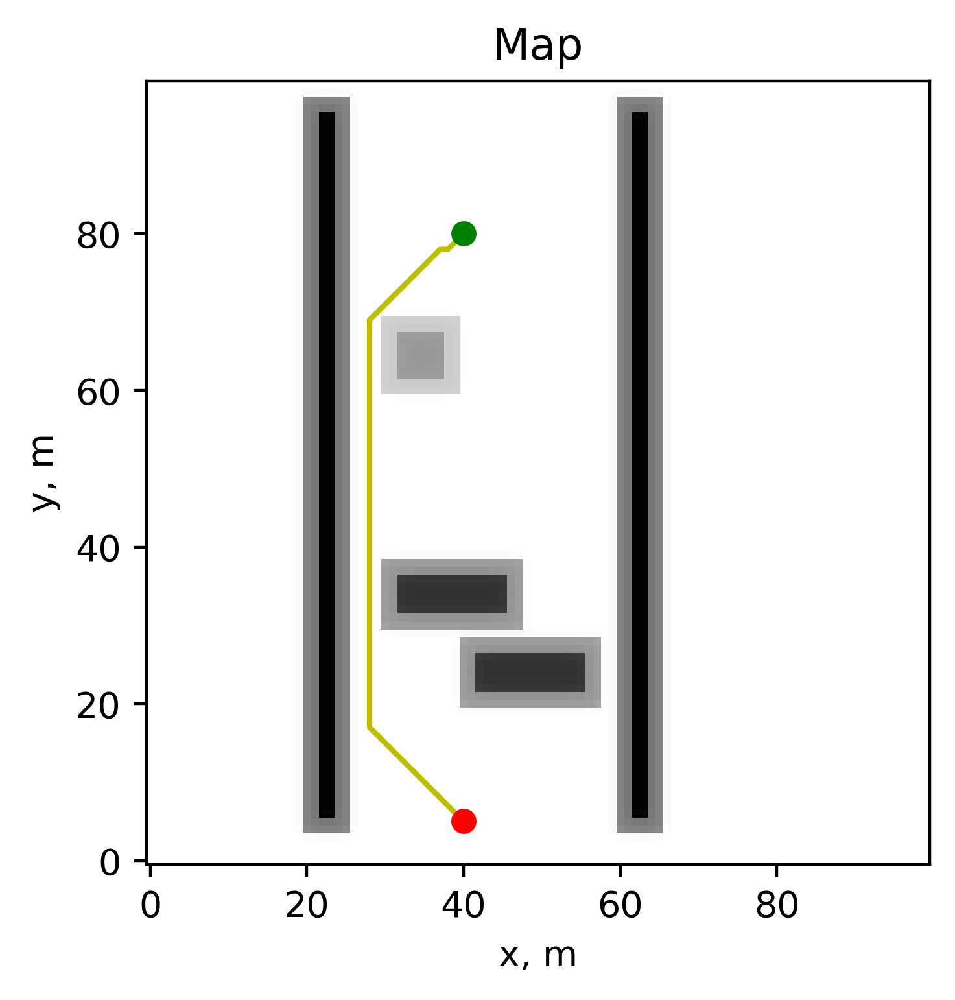

In [0]:
map_image = show_map(map_image=None, seed=1, smooth=0.4)
path, path_px = TestPlanner.test_on_map(map_image, start_pos=(40, 5), goal_pos=(40.0, 80.0))

## Try animation with differential movement

In [0]:
%%capture

# create an output with an empty figure
fig, ax1 = plt.subplots(figsize=(6, 6))
ax1.set_aspect('equal')
ax1.set(xlim=(-1, 16), ylim=(-1, 16))
line, = ax1.plot([],[])

In [0]:
# start = [10, 7, 2*np.pi]
# goal = [1, 2, 3*np.pi/2]

start = [0, 0, 2*np.pi]
goal = [13, 8, 3*np.pi/2]

x_start, y_start, theta_start = start[0], start[1], start[2]
x_goal, y_goal, theta_goal = goal[0], goal[1], goal[2]
x_traj, y_traj, theta_hist = [x_start, ], [y_start, ], [theta_start, ]

# simulation parameters
Kp_rho = 15
Kp_alpha = 15
Kp_beta = -3
dt = 0.01
distance_threshold = 0.2
angle_threshold = np.pi/30

# def initialize_variables(start, goal):

def get_robot_position():
    x = x_traj[-1]
    y = y_traj[-1]
    theta = theta_hist[-1]
    return x, y, theta

def calculate_next_position_differential(x, y, theta):
    """
    rho is the distance between the robot and the goal position
    alpha is the angle to the goal relative to the heading of the robot
    beta is the angle between the robot's position and the goal position plus the goal angle
    Kp_rho*rho and Kp_alpha*alpha drive the robot along a line towards the goal
    Kp_beta*beta rotates the line so that it is parallel to the goal angle
    """

    x_diff = x_goal - x
    y_diff = y_goal - y

    rho = np.hypot(x_diff, y_diff)
    alpha = wrap_angle(np.arctan2(y_diff, x_diff) - theta)

    if rho > distance_threshold or alpha > angle_threshold:
        beta = wrap_angle(theta_goal - theta - alpha)

        v = Kp_rho # * rho
        w = Kp_alpha * alpha + Kp_beta * beta

        if alpha > np.pi / 2 or alpha < -np.pi / 2:
            v = -v

        theta = theta + w * dt
        x = x + v * np.cos(theta) * dt
        y = y + v * np.sin(theta) * dt
    return x, y, theta

def record_trajectory(x, y, theta):
    x_traj.append(x)
    y_traj.append(y)
    theta_hist.append(theta)

def animate(i):

    """perform animation step"""

    # global x_goal, y_goal, theta_goal, x_traj, y_traj, theta_hist, dt

    ax1.cla()
    ax1.set_aspect('equal')
    ax1.set(xlim=(-1, 16), ylim=(-1, 16))

    x, y, theta = get_robot_position()

    plot_vehicle(x, y, theta)
    plot_trajectory(x_traj, y_traj)
    plot_goal()

    x, y, theta = calculate_next_position_differential(x, y, theta)
    record_trajectory(x, y, theta)

    line.set_data(x, y)

# uncomment this
# ani_arc = FuncAnimation(fig, animate, interval = 10, frames=150);
# ani_arc 

## Animate movement on a costmap

In [0]:
def plot_vehicle(x, y, theta):
    # Corners of triangular vehicle when pointing to the right (0 radians)

    p1_i = np.array([0.5, 0, 1]).T
    p2_i = np.array([-0.5, 0.25, 1]).T
    p3_i = np.array([-0.5, -0.25, 1]).T

    T = transformation_matrix(x, y, theta)
    p1 = np.matmul(T, p1_i)
    p2 = np.matmul(T, p2_i)
    p3 = np.matmul(T, p3_i)

    ax.plot([p1[0], p2[0]], [p1[1], p2[1]], 'k-')
    ax.plot([p2[0], p3[0]], [p2[1], p3[1]], 'k-')
    ax.plot([p3[0], p1[0]], [p3[1], p1[1]], 'k-')

def plot_trajectory(x_traj, y_traj):
    ax.plot(x_traj, y_traj, 'b--')

def plot_goal():
    ax.arrow(x_start, y_start, np.cos(theta_start),
          np.sin(theta_start), color='r', width=0.5)
    ax.arrow(x_goal, y_goal, np.cos(theta_goal),
          np.sin(theta_goal), color='g', width=0.5)

In [0]:
%%capture

def get_robot_position():
    x = x_traj[-1]
    y = y_traj[-1]
    theta = theta_hist[-1]
    return x, y, theta

def calculate_next_position_differential(x, y, theta):
    """
    rho is the distance between the robot and the goal position
    alpha is the angle to the goal relative to the heading of the robot
    beta is the angle between the robot's position and the goal position plus the goal angle
    Kp_rho*rho and Kp_alpha*alpha drive the robot along a line towards the goal
    Kp_beta*beta rotates the line so that it is parallel to the goal angle
    """

    x_diff = x_goal - x
    y_diff = y_goal - y

    rho = np.hypot(x_diff, y_diff)
    alpha = wrap_angle(np.arctan2(y_diff, x_diff) - theta)

    # complete stop
    if rho < distance_threshold and alpha < angle_threshold:
        return x, y, theta

    else:
        beta = wrap_angle(theta_goal - theta - alpha)
        v = Kp_rho  # * rho
        w = Kp_alpha * alpha + Kp_beta * beta
        if alpha > np.pi / 2 or alpha < -np.pi / 2:
            v = -v
        theta = theta + w * dt
        x = x + v * np.cos(theta) * dt
        y = y + v * np.sin(theta) * dt
    return x, y, theta

def record_trajectory(x, y, theta):
    x_traj.append(x)
    y_traj.append(y)
    theta_hist.append(theta)

def animate(i):

    """perform animation step"""

    # global x_goal, y_goal, theta_goal, x_traj, y_traj, theta_hist, dt

    # ax1.cla()
    # ax1.set(xlim=(-1, 16), ylim=(-1, 16))

    # ax.cla()
    # map_image = MapFactory().get_simple_map(size=(100,100), seed=2, smooth=0.8)
    ax.set_aspect('equal')

    x, y, theta = get_robot_position()

    plot_vehicle(x, y, theta)
    plot_trajectory(x_traj, y_traj)
    plot_goal()

    x, y, theta = calculate_next_position_differential(x, y, theta)
    record_trajectory(x, y, theta)

    line.set_data(x, y)



map_image = MapFactory().get_simple_map(size=(100,100), seed=2, smooth=0.8)
fig, ax = plt.subplots(dpi=200)
ax.cla()
ax.set_aspect('equal')
line, = ax.plot([],[])
ax.grid(False)
ax.imshow(map_image, cmap="gray_r", origin="low")
ax.set_title("Map")
ax.set_xlabel("x, m")
ax.set_ylabel("y, m")



start = [0, 0, 2*np.pi]
# goal = [80, 80, 3*np.pi/2]
goal = [80, 80, np.pi/2]


x_start, y_start, theta_start = start[0], start[1], start[2]
x_goal, y_goal, theta_goal = goal[0], goal[1], goal[2]
x_traj, y_traj, theta_hist = [x_start, ], [y_start, ], [theta_start, ]

# simulation parameters
Kp_rho = 120
Kp_alpha = 30
Kp_beta = -3
dt = 0.01
distance_threshold = 1
angle_threshold = np.pi/30.


ani_arc = FuncAnimation(fig, animate, interval = 20, frames=100);

In [0]:
# ani_arc

## Cubic spline

In [0]:
# ! git clone https://github.com/nickzherdev/PythonRobotics

In [0]:
"""
cubic spline planner

Author: Atsushi Sakai

"""
import math
import numpy as np
import bisect


class Spline:
    """
    Cubic Spline class
    """

    def __init__(self, x, y):
        self.b, self.c, self.d, self.w = [], [], [], []

        self.x = x
        self.y = y

        self.nx = len(x)  # dimension of x
        h = np.diff(x)

        # calc coefficient c
        self.a = [iy for iy in y]

        # calc coefficient c
        A = self.__calc_A(h)
        B = self.__calc_B(h)
        self.c = np.linalg.solve(A, B)
        #  print(self.c1)

        # calc spline coefficient b and d
        for i in range(self.nx - 1):
            self.d.append((self.c[i + 1] - self.c[i]) / (3.0 * h[i]))
            tb = (self.a[i + 1] - self.a[i]) / h[i] - h[i] * \
                (self.c[i + 1] + 2.0 * self.c[i]) / 3.0
            self.b.append(tb)

    def calc(self, t):
        """
        Calc position

        if t is outside of the input x, return None

        """

        if t < self.x[0]:
            return None
        elif t > self.x[-1]:
            return None

        i = self.__search_index(t)
        dx = t - self.x[i]
        result = self.a[i] + self.b[i] * dx + \
            self.c[i] * dx ** 2.0 + self.d[i] * dx ** 3.0

        return result

    def calcd(self, t):
        """
        Calc first derivative

        if t is outside of the input x, return None
        """

        if t < self.x[0]:
            return None
        elif t > self.x[-1]:
            return None

        i = self.__search_index(t)
        dx = t - self.x[i]
        result = self.b[i] + 2.0 * self.c[i] * dx + 3.0 * self.d[i] * dx ** 2.0
        return result

    def calcdd(self, t):
        """
        Calc second derivative
        """

        if t < self.x[0]:
            return None
        elif t > self.x[-1]:
            return None

        i = self.__search_index(t)
        dx = t - self.x[i]
        result = 2.0 * self.c[i] + 6.0 * self.d[i] * dx
        return result

    def __search_index(self, x):
        """
        search data segment index
        """
        return bisect.bisect(self.x, x) - 1

    def __calc_A(self, h):
        """
        calc matrix A for spline coefficient c
        """
        A = np.zeros((self.nx, self.nx))
        A[0, 0] = 1.0
        for i in range(self.nx - 1):
            if i != (self.nx - 2):
                A[i + 1, i + 1] = 2.0 * (h[i] + h[i + 1])
            A[i + 1, i] = h[i]
            A[i, i + 1] = h[i]

        A[0, 1] = 0.0
        A[self.nx - 1, self.nx - 2] = 0.0
        A[self.nx - 1, self.nx - 1] = 1.0
        #  print(A)
        return A

    def __calc_B(self, h):
        """
        calc matrix B for spline coefficient c
        """
        B = np.zeros(self.nx)
        for i in range(self.nx - 2):
            B[i + 1] = 3.0 * (self.a[i + 2] - self.a[i + 1]) / \
                h[i + 1] - 3.0 * (self.a[i + 1] - self.a[i]) / h[i]
        #  print(B)
        return B


class Spline2D:
    """
    2D Cubic Spline class

    """

    def __init__(self, x, y):
        self.s = self.__calc_s(x, y)
        self.sx = Spline(self.s, x)
        self.sy = Spline(self.s, y)

    def __calc_s(self, x, y):
        dx = np.diff(x)
        dy = np.diff(y)
        self.ds = [math.sqrt(idx ** 2 + idy ** 2)
                   for (idx, idy) in zip(dx, dy)]
        s = [0]
        s.extend(np.cumsum(self.ds))
        return s

    def calc_position(self, s):
        """
        calc position
        """
        x = self.sx.calc(s)
        y = self.sy.calc(s)

        return x, y

    def calc_curvature(self, s):
        """
        calc curvature
        """
        dx = self.sx.calcd(s)
        ddx = self.sx.calcdd(s)
        dy = self.sy.calcd(s)
        ddy = self.sy.calcdd(s)
        k = (ddy * dx - ddx * dy) / (dx ** 2 + dy ** 2)
        return k

    def calc_yaw(self, s):
        """
        calc yaw
        """
        dx = self.sx.calcd(s)
        dy = self.sy.calcd(s)
        yaw = math.atan2(dy, dx)
        return yaw


def calc_spline_course(x, y, ds=0.1):
    sp = Spline2D(x, y)
    s = list(np.arange(0, sp.s[-1], ds))

    rx, ry, ryaw, rk = [], [], [], []
    for i_s in s:
        ix, iy = sp.calc_position(i_s)
        rx.append(ix)
        ry.append(iy)
        ryaw.append(sp.calc_yaw(i_s))
        rk.append(sp.calc_curvature(i_s))

    return rx, ry, ryaw, rk, s


## Spline the path

Spline 2D test


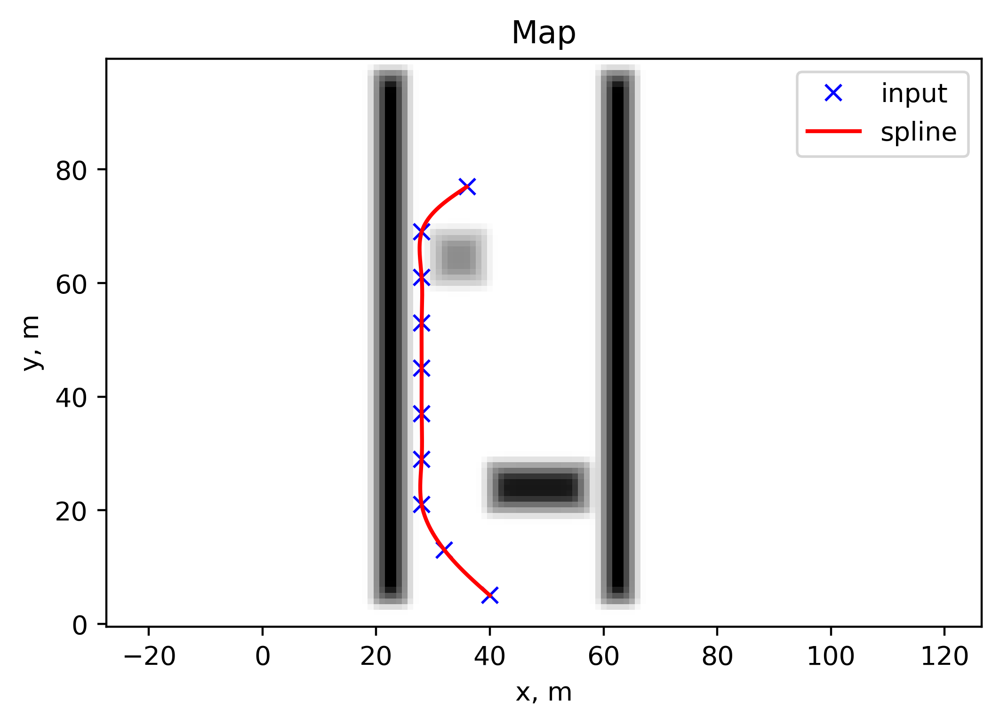

In [0]:
def main():  # pragma: no cover
    print("Spline 2D test")
    import matplotlib.pyplot as plt
    # x = [-2.5, 0.0, 2.5, 5.0, 7.5, 3.0, -1.0]
    y = [0.7, -6, 5, 6.5, 0.0, 5.0, -2.0]

    x = np.array(path)[:, 0][::8]
    y = np.array(path)[:, 1][::8]

    sp = Spline2D(x, y)
    s = np.arange(0, sp.s[-1], 0.1)

    rx, ry, ryaw, rk = [], [], [], []
    for i_s in s:
        ix, iy = sp.calc_position(i_s)
        rx.append(ix)
        ry.append(iy)
        ryaw.append(sp.calc_yaw(i_s))
        rk.append(sp.calc_curvature(i_s))

    # plt.subplots(1, dpi=200)
    # plt.plot(x, y, "xb", label="input")
    # plt.plot(rx, ry, "-r", label="spline")
    # plt.grid(True)
    # plt.axis("equal")
    # plt.xlabel("x[m]")
    # plt.ylabel("y[m]")
    # plt.legend()


    fig, ax = plt.subplots(dpi=200)

    ax.plot(x, y, "xb", label="input")
    ax.plot(rx, ry, "-r", label="spline")
    ax.grid(False)
    ax.axis("equal")
    ax.set_title("Map")
    ax.set_xlabel("x, m")
    ax.set_ylabel("y, m")
    ax.legend()
    ax.imshow(map_image, cmap="gray_r", origin="low")
    # ax.imshow(origin="low") #, interpolation='none') #, cmap="gray_r")
    plt.draw()

    ax.xaxis.tick_bottom()                     # and move the X-Axis      
    # ax.yaxis.set_ticks(np.arange(0, 100, 10)) # set y-ticks
    # ax.xaxis.set_ticks(np.arange(0, 100, 10)) # set y-ticks

    ax.yaxis.tick_left()                    # remove right y-Ticks


    # USEFUL GRAPHICS
    # plt.subplots(1)
    # plt.plot(s, [np.rad2deg(iyaw) for iyaw in ryaw], "-r", label="yaw")
    # plt.grid(True)
    # plt.legend()
    # plt.xlabel("line length[m]")
    # plt.ylabel("yaw angle[deg]")

    # plt.subplots(1)
    # plt.plot(s, rk, "-r", label="curvature")
    # plt.grid(True)
    # plt.legend()
    # plt.xlabel("line length[m]")
    # plt.ylabel("curvature [1/m]")

    # plt.show(origin="low")


main()


path = path

In [0]:
# show_map(map_image=None, seed=2, smooth=0.8);
# path, path_px = TestPlanner.test_on_map(map_image, start_pos=(40, 5), goal_pos=(40.0, 80.0))

## Pure pursuit

### Functions for pure pursuit algorithm

In [0]:
# Parameters
k = 0.1  # look forward gain
Lfc = 2.0  # [m] look-ahead distance
Kp = 1.0  # speed proportional gain
dt = 0.1  # [s] time tick
WB = 2.9  # [m] wheel base of vehicle

show_animation = True

In [0]:
class State:

    def __init__(self, x=0.0, y=0.0, yaw=0.0, v=0.0):
        self.x = x
        self.y = y
        self.yaw = yaw
        self.v = v
        self.rear_x = self.x - ((WB / 2) * math.cos(self.yaw))
        self.rear_y = self.y - ((WB / 2) * math.sin(self.yaw))

    def update(self, a, delta):
        self.x += self.v * math.cos(self.yaw) * dt
        self.y += self.v * math.sin(self.yaw) * dt
        self.yaw += self.v / WB * math.tan(delta) * dt
        self.v += a * dt
        self.rear_x = self.x - ((WB / 2) * math.cos(self.yaw))
        self.rear_y = self.y - ((WB / 2) * math.sin(self.yaw))

    def calc_distance(self, point_x, point_y):
        dx = self.rear_x - point_x
        dy = self.rear_y - point_y
        return math.hypot(dx, dy)

In [0]:
class States:

    def __init__(self):
        self.x = []
        self.y = []
        self.yaw = []
        self.v = []
        self.t = []

    def append(self, t, state):
        self.x.append(state.x)
        self.y.append(state.y)
        self.yaw.append(state.yaw)
        self.v.append(state.v)
        self.t.append(t)

In [0]:
def proportional_control(target, current):
    a = Kp * (target - current)

    return a

In [0]:
class TargetCourse:

    def __init__(self, cx, cy):
        self.cx = cx
        self.cy = cy
        self.old_nearest_point_index = None

    def search_target_index(self, state):

        # To speed up nearest point search, doing it at only first time.
        if self.old_nearest_point_index is None:
            # search nearest point index
            dx = [state.rear_x - icx for icx in self.cx]
            dy = [state.rear_y - icy for icy in self.cy]
            d = np.hypot(dx, dy)
            ind = np.argmin(d)
            self.old_nearest_point_index = ind
        else:
            ind = self.old_nearest_point_index
            distance_this_index = state.calc_distance(self.cx[ind],
                                                      self.cy[ind])
            while True:
                distance_next_index = state.calc_distance(self.cx[ind + 1],
                                                          self.cy[ind + 1])
                if distance_this_index < distance_next_index:
                    break
                ind = ind + 1 if (ind + 1) < len(self.cx) else ind
                distance_this_index = distance_next_index
            self.old_nearest_point_index = ind

        Lf = k * state.v + Lfc  # update look ahead distance

        # search look ahead target point index
        while Lf > state.calc_distance(self.cx[ind], self.cy[ind]):
            if (ind + 1) >= len(self.cx):
                break  # not exceed goal
            ind += 1

        return ind, Lf

In [0]:
def pure_pursuit_steer_control(state, trajectory, pind):
    ind, Lf = trajectory.search_target_index(state)

    if pind >= ind:
        ind = pind

    if ind < len(trajectory.cx):
        tx = trajectory.cx[ind]
        ty = trajectory.cy[ind]
    else:  # toward goal
        tx = trajectory.cx[-1]
        ty = trajectory.cy[-1]
        ind = len(trajectory.cx) - 1

    alpha = math.atan2(ty - state.rear_y, tx - state.rear_x) - state.yaw

    delta = math.atan2(2.0 * WB * math.sin(alpha) / Lf, 1.0)

    return delta, ind

In [0]:
def plot_arrow(x, y, yaw, length=1.0, width=0.5, fc="r", ec="k"):
    """
    Plot arrow
    """
    # ax.gca()

    if not isinstance(x, float):
        for ix, iy, iyaw in zip(x, y, yaw):
            plot_arrow(ix, iy, iyaw)
    else:
        ax.arrow(x, y, length * math.cos(yaw), length * math.sin(yaw),
                  fc=fc, ec=ec, head_width=width, head_length=width)
        ax.plot(x, y)

### Animation pure pursuit

In [0]:
%%capture
map_image = MapFactory().get_simple_map(size=(100,100), seed=2, smooth=0.8)
fig, ax = plt.subplots(dpi=200)
ax.cla()
ax.set_aspect('equal')
line, = ax.plot([],[])
ax.grid(False)
ax.imshow(map_image, cmap="gray_r", origin="low")
ax.set_title("Map")
ax.set_xlabel("x, m")
ax.set_ylabel("y, m")

# cx = np.arange(0, 50, 0.5)
# cy = [math.sin(ix / 5.0) * ix / 2.0 for ix in cx]
path, path_px = TestPlanner.test_on_map(map_image, start_pos=(40, 5), goal_pos=(40.0, 80.0))
cx = np.array(path)[:, 0]
cy = np.array(path)[:, 1]

target_speed = 2 # 10.0 / 3.6  # [m/s]

T = 100.0  # max simulation time

# initial state
# state = State(x=-0.0, y=-3.0, yaw=0.0, v=0.0)
state = State(x=cx[0], y=cy[0], yaw=np.pi/3, v=0.0)

lastIndex = len(cx) - 1
time = 0.0
states = States()
states.append(time, state)
target_course = TargetCourse(cx, cy)
target_ind, _ = target_course.search_target_index(state)


def animate(i):
    global time, target_ind
    """perform animation step"""

    if T >= time and lastIndex > target_ind:

        # Calc control input
        ai = proportional_control(target_speed, state.v)
        di, target_ind = pure_pursuit_steer_control(
            state, target_course, target_ind)

        state.update(ai, di)  # Control vehicle

        time += dt
        states.append(time, state)


    ax.cla()
    ax.set_aspect('equal')
    line, = ax.plot([],[])
    ax.grid(False)
    ax.imshow(map_image, cmap="gray_r", origin="low")
    ax.set_title("Map")
    ax.set_xlabel("x, m")
    ax.set_ylabel("y, m")

    plot_arrow(state.x, state.y, state.yaw)
    ax.plot(cx, cy, "--r", label="course")  # markersize=12
    ax.plot(states.x, states.y, "-b", label="trajectory")
    ax.plot(cx[target_ind], cy[target_ind], "xg", label="target")
    # ax.title("Speed[km/h]:" + str(state.v * 3.6)[:4])
    # ax.pause(0.001)

    line.set_data(state.x, state.y)

ani_arc = FuncAnimation(fig, animate, interval = 10, frames=400);

In [0]:
ani_arc

## Sandbox

In [0]:
x = "Mike"
print(dir(x))

# nn_output = {"name": "box",
#              "dim": np.array((2, 2)),
#              "cost": 5,
#              "obj_id": 1}

['__add__', '__class__', '__contains__', '__delattr__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getitem__', '__getnewargs__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__iter__', '__le__', '__len__', '__lt__', '__mod__', '__mul__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__rmod__', '__rmul__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', 'capitalize', 'casefold', 'center', 'count', 'encode', 'endswith', 'expandtabs', 'find', 'format', 'format_map', 'index', 'isalnum', 'isalpha', 'isdecimal', 'isdigit', 'isidentifier', 'islower', 'isnumeric', 'isprintable', 'isspace', 'istitle', 'isupper', 'join', 'ljust', 'lower', 'lstrip', 'maketrans', 'partition', 'replace', 'rfind', 'rindex', 'rjust', 'rpartition', 'rsplit', 'rstrip', 'split', 'splitlines', 'startswith', 'strip', 'swapcase', 'title', 'translate', 'upper', 'zfill']


In [0]:
import numpy as np
import matplotlib.pyplot as plt

box = np.ones((2, 2))
box_cost = box * 5
map_binary_layer = np.zeros((10, 10))
map_cost_layer = map_binary_layer.copy()

box_with_pads = np.pad(box, 4)
cost_box_with_pads = box_with_pads * 5

map_binary_layer = map_binary_layer + box_with_pads  # result is a projected box

radius = 1
box_ = np.pad(box, radius)
inf_ = np.pad(box, radius, "maximum")

box_inflation_cloud = (inf_ - box_)
box_inflation_cloud

array([[1., 1., 1., 1.],
       [1., 0., 0., 1.],
       [1., 0., 0., 1.],
       [1., 1., 1., 1.]])

In [0]:
# import cv2                                # state of the art computer vision algorithms library

# image = cv2.imread("aligned_color.png")
	
# # transparency value
# alpha = 0.5
# # create two copies of the original image -- one for
# # the overlay and one for the final output image
# overlay = image.copy()
# output = image.copy()

# cv2.addWeighted(overlay, alpha, image, 1 - alpha, 0, output)

# plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
# plt.imsave("segmented_color.png", cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
# # plt.grid()
# plt.show()

In [0]:
import numpy as np

#two 3d arrays, of different size.
b1 = np.zeros((5,5,5), dtype=np.int) # a 5x5x5 matrix of zeroes
b2 = np.ones((3,3,3), dtype=np.int)  # a 3x3x3 matrix of ones

pos_v, pos_h, pos_z = 2, 2, 2  # a 3d offset -> to plonk b2 in the corner of b1

v_range1 = slice(max(0, pos_v), max(min(pos_v + b2.shape[0], b1.shape[0]), 0))
h_range1 = slice(max(0, pos_h), max(min(pos_h + b2.shape[1], b1.shape[1]), 0))
z_range1 = slice(max(0, pos_z), max(min(pos_z + b2.shape[2], b1.shape[2]), 0))

v_range2 = slice(max(0, -pos_v), min(-pos_v + b1.shape[0], b2.shape[0]))
h_range2 = slice(max(0, -pos_h), min(-pos_h + b1.shape[1], b2.shape[1]))
z_range2 = slice(max(0, -pos_z), min(-pos_z + b1.shape[2], b2.shape[2]))

b1[v_range1, h_range1, z_range1] += b2[v_range2, h_range2, z_range2]

In [0]:
# inflation_cost=3 * inflation_cost  # TODO: make with exponential decay

    # def set_inflation_radius()
        # self.infl_cost_layer = add_at_pos(self.infl_cost_layer, obstacle.inflation_cloud_cost, location)
        # self.costmap = self.obj_cost_layer + self.infl_cost_layer

In [0]:
# im = Image.fromarray(img)
# im.save("map_w_obstacles1.png", "PNG")  # save as 1ch pic
# gmap = OccupancyGridMap.from_png('map_w_obstacles1.png', 1)

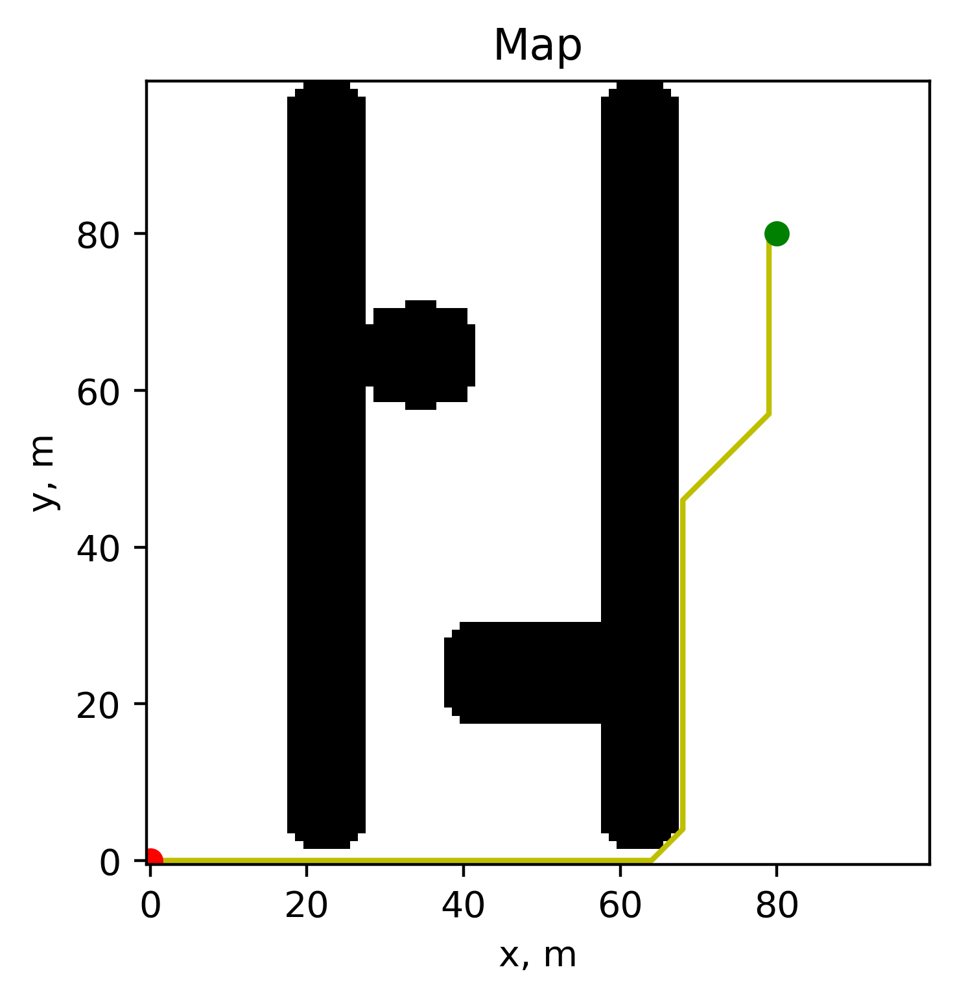

In [0]:
gmap = MY_OccupancyGridMap(map_image, 1)
gmap.plot()

# set a start and an end node (in meters)
start_node_dif_frame = (0.0, 0.0)
goal_node = (80.0, 80.0)

path, path_px = a_star(start_node_dif_frame, goal_node, gmap, movement='8N')
plot_path(path_px)

In [0]:
x = np.array(path)[:, 0][::3]
x

array([ 0,  3,  6,  9, 12, 15, 18, 21, 24, 27, 30, 33, 36, 39, 42, 45, 48,
       51, 54, 57, 60, 63, 66, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68,
       68, 68, 68, 69, 72, 75, 78, 79, 79, 79, 79, 79, 79, 79, 80])